# 1. Prepare

In [2]:
%load_ext autoreload

%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import math
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow, imread, imsave, figure
import pandas as pd
import numpy as np
import sys
import os
from skimage.color import rgb2gray
from skimage.transform import rescale, resize
import seaborn as sns

#Keras:
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import LearningRateScheduler
from keras.optimizers import SGD
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler

#Custom Functions:
ROOT_DIR = os.path.abspath("../")
sys.path.append(ROOT_DIR)

from imports.utils.log_progress import log_progress
from imports.utils.visualization import Visualize, Evaluate
from imports.models.data_generator_unitbox import DataGenerator
from imports.utils.enums import DATA_BASE_PATH, SHAPE
from imports.models.u_net import get_unet, get_unet_mod
from imports.utils.utils import rle_encode, rle_decode
from imports.models.unit_box import unit_box

DATA_IMAGE_PATH = DATA_BASE_PATH + '/Images'
DATA_MASK_PATH = DATA_BASE_PATH + '/Masks'

SHAPE = (512,768)

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
/opt/conda/lib/python3.6/site-packages/classification_models/resnext/__init__.py:4: UserWarning: Current ResNext models are deprecated, use keras.applications ResNeXt models
  warnings.warn('Current ResNext models are deprecated, '


In [4]:
import warnings
warnings.filterwarnings("ignore")

### Check if GPU available:

In [5]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

[]

### Read Dataframes:

In [6]:
df = pd.read_pickle(DATA_BASE_PATH+"/df")
df.head(1)

,image_path,mask_path,mask_cirlce_path,name,dataset,mask_rle,mask_circle_rle,roots,splines
0,../data/00_all/images/,../data/00_all/masks/,../data/00_all/masks_autogen/,img_1000.png,None,773 253 1061 130 2308 255 2596 131 3845 254 41...,210163 81 214744 135 219334 171 223927 201 228...,"[[947.6608444830582, 198.98217169159952]]","[[[650.1494324934839, 103.97898089758343], [72..."


### Load Splited Data

In [7]:
train_df = pd.read_pickle(DATA_BASE_PATH+'/train_df')
val_df = pd.read_pickle(DATA_BASE_PATH+'/val_df')
test_df = pd.read_pickle(DATA_BASE_PATH+'/test_df')

print("Number of training Samples:", len(train_df))
print("Number of validation Samples:", len(val_df))
print("Number of test Samples:", len(test_df))

Number of training Samples: 354
Number of validation Samples: 102
Number of test Samples: 51


In [8]:
train_df.sample(1)

,image_path,mask_path,mask_cirlce_path,name,dataset,mask_rle,mask_circle_rle,roots,splines
279,../data/00_all/images/,../data/00_all/masks/,../data/00_all/masks_autogen/,img_1401.png,None,450681 2 452213 11 453748 13 455283 15 456819 ...,1041781 81 1046362 135 1050952 171 1055545 201...,"[[779.370403475239, 489.52947479861905], [601....","[[[1.9843073779322329, 335.03624395857304], [5..."


# 3 Training:

### 3.1 Load UNet Model:

Vanilla UNet:

In [51]:
model = unit_box(input_shape=(*SHAPE,3))

Tensor("loss_3/bbox_loss/Select:0", shape=(?, ?, ?, 1), dtype=float32)
Tensor("metrics_2/IOULoss/Select:0", shape=(?, ?, ?, 1), dtype=float32)


In [52]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            (None, 512, 768, 3)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 512, 768, 64) 1792        input_8[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 512, 768, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 256, 384, 64) 0           block1_conv2[0][0]               
__________________________________________________________________________________________________
block2_con

In [11]:
from keras.utils import plot_model
plot_model(model, to_file='model.png')

ImportError: Failed to import `pydot`. Please install `pydot`. For example with `pip install pydot`.

### 3.2 Define Train- Generator:

In [20]:
df_labels = pd.read_csv('../data/labels3.csv',sep=";") 
df_labels.sample(3)

,imageFilename,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
211,D:\10_GitHub\Agroscope\data\00_all\images\img_...,733,759,261,569,263,253,285,218,0,...,0,0,0,0,0,0,0,0,0,0
325,D:\10_GitHub\Agroscope\data\00_all\images\img_...,531,1,232,1,405,281,336,158,0,...,0,0,0,0,0,0,0,0,0,0
119,D:\10_GitHub\Agroscope\data\00_all\images\img_...,43,629,383,309,315,314,219,226,0,...,0,0,0,0,0,0,0,0,0,0


In [21]:
selected_row = df_labels[df_labels['imageFilename'].str.contains(str('img_1011'))]
tmp = list(selected_row.values)[0][1:-1]
chunks = [tmp[i:i + 4] for i in range(0, len(tmp), 4)]
not_zero_chunks = [c for c in chunks if sum(c)>0]
not_zero_chunks

[array([447, 190, 576, 646], dtype=object)]

In [30]:
params = {'target_size': SHAPE,
          'batch_size': 4,
          'input_channels': 3,
          'shuffle': True}

# Generators
sample_gen = DataGenerator(df=train_df,df_labels=df_labels,hist_equal=True,augment_data=False,save_images=False,**params)
i_sample = iter(sample_gen)

Found 354 Files


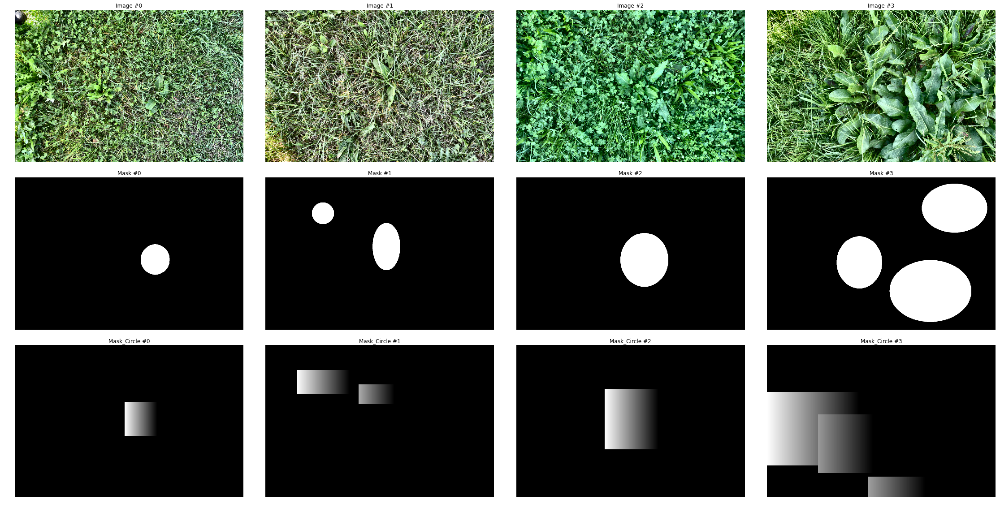

In [31]:
imgs,outputs = next(i_sample)
plt.figure(figsize=(40,20))
x,y =4,1
for i in range(y):
    for j in range(x):
        plt.subplot(y*3,x,i*2*x+j+1)
        pos = i+j
        plt.imshow(imgs[pos,:,:,:].reshape(*SHAPE,3))
        plt.title('Image #{}'.format(pos))
        plt.axis('off')
        plt.subplot(y*3,x,(i*2+1)*x+j+1)
        plt.imshow(outputs[0][pos,:,:,0].reshape(SHAPE),cmap='gray')
        plt.title('Mask #{}'.format(pos))
        plt.axis('off')
        plt.subplot(y*3,x,(i*2+2)*x+j+1)
        plt.imshow(outputs[1][pos,:,:,3].reshape(SHAPE),cmap='gray')
        plt.title('Mask_Circle #{}'.format(pos))
        plt.axis('off')
        
plt.subplots_adjust(wspace=0.01, hspace=0.1)
plt.show()

In [32]:
print(imgs.shape)
print(outputs[0].shape)
print(outputs[1].shape)
print(imgs.max())
print(outputs[0].max())
print(outputs[1].max())

(4, 512, 768, 3)
(4, 512, 768, 1)
(4, 512, 768, 4)
1.0
1.0
1.0


### 3.5 Train:

In [53]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau, TensorBoard

BS = 4
import math
def step_decay(epoch):
    initial_lrate = 0.0001
    drop = 0.1
    epochs_drop = 20.0
    lrate = initial_lrate * math.pow(drop,math.floor((1+epoch)/epochs_drop))
    print("Learning Rate: " + str(lrate))
    return lrate

lrate = LearningRateScheduler(step_decay)


checkpoint = ModelCheckpoint('best_model.h5', 
                             monitor='val_dice_coeff', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='max', 
                             save_weights_only = False)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_dice_coeff', 
                                   factor=0.1, 
                                   patience=6, 
                                   verbose=1, 
                                   mode='max', 
                                   epsilon=0.0001, 
                                   cooldown=6, 
                                   min_lr=0.0001)

early = EarlyStopping(monitor="val_dice_coeff", 
                      mode="max", 
                      patience=15,
                      restore_best_weights=True)

tensorboard = TensorBoard(log_dir='../docs/tensorboard', 
                            histogram_freq=0, 
                            batch_size=BS, 
                            write_graph=True, 
                            write_grads=False, 
                            write_images=False, 
                            embeddings_freq=0, 
                            embeddings_layer_names=None, 
                            embeddings_metadata=None, 
                            embeddings_data=None, 
                            update_freq='epoch')

callbacks_list = [early]

In [54]:
params = {'target_size': (512,768),
          'batch_size': 4,
          'input_channels': 3,
          'shuffle': True}

# Generators
training_generator = DataGenerator(df=train_df,df_labels=df_labels,hist_equal=True,augment_data=False,save_images=False,**params)
validation_generator = DataGenerator(df=val_df,df_labels=df_labels,hist_equal=True,**params)

Found 354 Files
Found 102 Files


In [55]:
a,b = model.predict(np.random.rand(1,*SHAPE,3))
b.shape

(1, 512, 768, 4)

In [ ]:
H = model.fit_generator(
    training_generator,
    steps_per_epoch=len(train_df) // BS,
    validation_data=validation_generator,
    validation_steps=len(val_df) // BS,
    epochs=1,
    verbose=1,
    use_multiprocessing=False,
    workers=1,
    callbacks=callbacks_list)

Epoch 1/1
 7/88 [=>............................] - ETA: 16:54 - loss: nan - score_loss: 1.0570 - bbox_loss: nan - score_binary_crossentropy: 1.0571 - bbox_IOULoss: nan- ETA: 15:00 - loss: nan - score_loss: 1.0384 - bbox_loss: nan - score_binary_crossentropy: 1.0385 - bbox_IOULoss: na

In [18]:
from segmentation_models.utils import set_trainable
set_trainable(model)

In [19]:
H2 = model.fit_generator(
    training_generator,
    steps_per_epoch=len(train_df)*1 // BS,
    validation_data=validation_generator,
    validation_steps=len(val_df) // BS,
    epochs=20,
    verbose=1,
    use_multiprocessing=True,
    workers=8,
    callbacks=callbacks_list)

Epoch 1/20
88/88 [==============================] - 89s 1s/step - loss: 1.0012 - iou_score: 0.1856 - dice_coeff: 0.3434 - val_loss: 1.0002 - val_iou_score: 0.1996 - val_dice_coeff: 0.3637
Epoch 2/20
88/88 [==============================] - 78s 889ms/step - loss: 0.8828 - iou_score: 0.2591 - dice_coeff: 0.4489 - val_loss: 0.9744 - val_iou_score: 0.2562 - val_dice_coeff: 0.4369
Epoch 3/20
88/88 [==============================] - 79s 894ms/step - loss: 0.7848 - iou_score: 0.3311 - dice_coeff: 0.5409 - val_loss: 0.9770 - val_iou_score: 0.1882 - val_dice_coeff: 0.3363
Epoch 4/20
88/88 [==============================] - 79s 894ms/step - loss: 0.7070 - iou_score: 0.3977 - dice_coeff: 0.6028 - val_loss: 0.6996 - val_iou_score: 0.4084 - val_dice_coeff: 0.6193
Epoch 5/20
88/88 [==============================] - 79s 895ms/step - loss: 0.6482 - iou_score: 0.4506 - dice_coeff: 0.6464 - val_loss: 0.6955 - val_iou_score: 0.4166 - val_dice_coeff: 0.6134
Epoch 6/20
88/88 [==============================

Process ForkPoolWorker-273:
Process ForkPoolWorker-283:
Process ForkPoolWorker-285:
Process ForkPoolWorker-284:
Process ForkPoolWorker-281:
Process ForkPoolWorker-279:
Traceback (most recent call last):
Process ForkPoolWorker-288:
Process ForkPoolWorker-276:
Process ForkPoolWorker-278:
Process ForkPoolWorker-287:
Process ForkPoolWorker-286:
Traceback (most recent call last):
Process ForkPoolWorker-280:
Traceback (most recent call last):
Process ForkPoolWorker-277:
Process ForkPoolWorker-282:
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (most recent call last):
Process ForkPoolWorker-274:
Traceback (most recent call last):
Traceback (most recent call last):
Process ForkPoolWorker-275:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (m

  File "/usr/lib/python3.6/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 335, in get
    res = self._reader.recv_bytes()
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 379, in _recv
    chunk = read(handle, remaining)
  File "/usr/lib/python3.6/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/usr/lib/python3.6/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
KeyboardInterrupt
  File "/usr/lib/python3.6/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
KeyboardInterrupt
KeyboardInterrupt
  File "/usr/lib/python3.6/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
  File "skimage/transform/_warps_cy.pyx", line 131, in skimage.transform._w

KeyboardInterrupt: 

In [17]:
vis_params = {'df':val_df,
              'input_shape':(512,768,3),
              'pred_layer':1,
              'model':model}

visualize = Visualize(**vis_params)

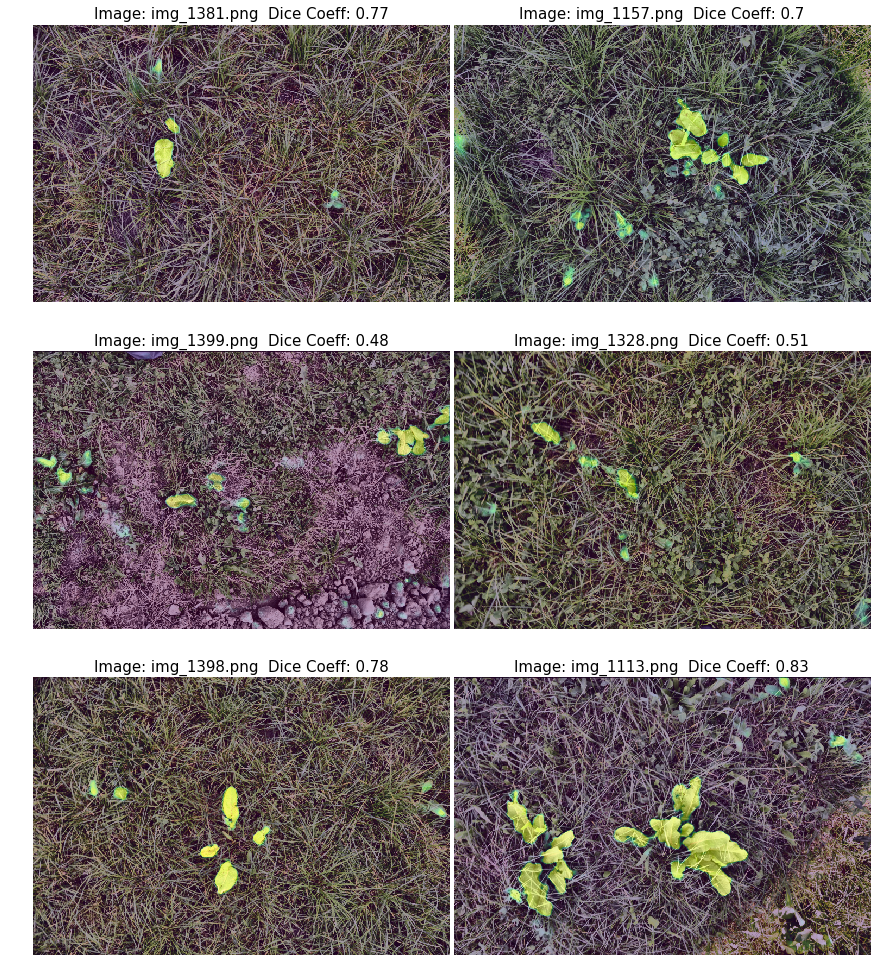

In [18]:
visualize.show_matrix(index='random',mode='image_prediction',rows=3)

In [19]:
H2 = H

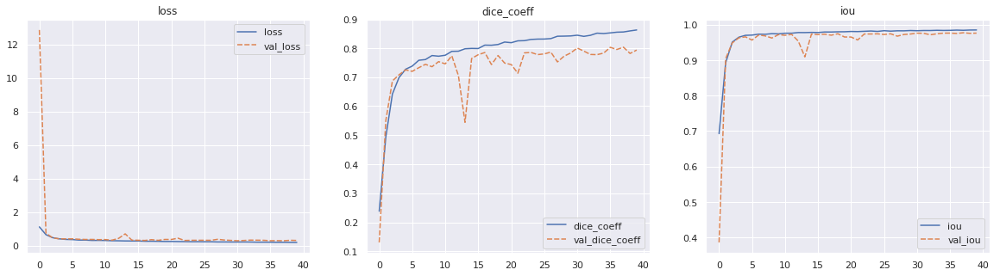

In [21]:
plt.figure(figsize=(20,5))

plt.subplot(1,3,1)
data = {#"epochs":np.linspace(0,len(H.history['dice_coeff']),len(H.history['dice_coeff'])),
        "loss":H2.history['loss'],
        "val_loss":H2.history['val_loss']}
loss_data = pd.DataFrame.from_dict(data)
sns.set(style="darkgrid")
ax = sns.lineplot(data=loss_data).set_title("loss")

plt.subplot(1,3,2)
data = {#"epochs":np.linspace(0,len(H.history['dice_coeff']),len(H.history['dice_coeff'])),
        "dice_coeff":H2.history['dice_coeff'],
        "val_dice_coeff":H2.history['val_dice_coeff']}
dice_data = pd.DataFrame.from_dict(data)
sns.set(style="darkgrid")
ax = sns.lineplot(data=dice_data).set_title("dice_coeff")

plt.subplot(1,3,3)
data = {#"epochs":np.linspace(0,len(H.history['dice_coeff']),len(H.history['dice_coeff'])),
        "iou":H2.history['iou'],
        "val_iou":H2.history['val_iou']}
iou_data = pd.DataFrame.from_dict(data)
sns.set(style="darkgrid")
ax = sns.lineplot(data=iou_data).set_title("iou")

In [16]:
model.save('unet_dice_0.7930_iou_0.9759.h5')

In [22]:
loss_data.to_pickle("loss_data_df_unet_dice_0.7930_iou_0.9759")
dice_data.to_pickle("dice_data_df_unet_dice_0.7930_iou_0.9759")
iou_data.to_pickle("iou_data_df_unet_dice_0.7930_iou_0.9759")

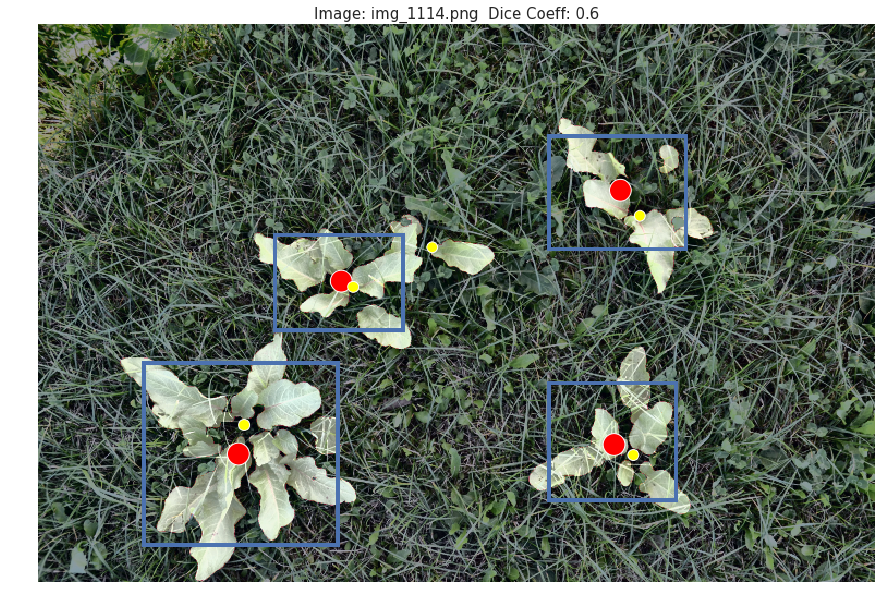

In [39]:
vis_params = {'df':val_df,
              'input_shape':(512,768,3),
              'pred_layer':2,
              'model':model}

root_pred = Visualize(**vis_params)
#img_1114
root_pred.show_single("img_1114",mode="image_prediction_roots")

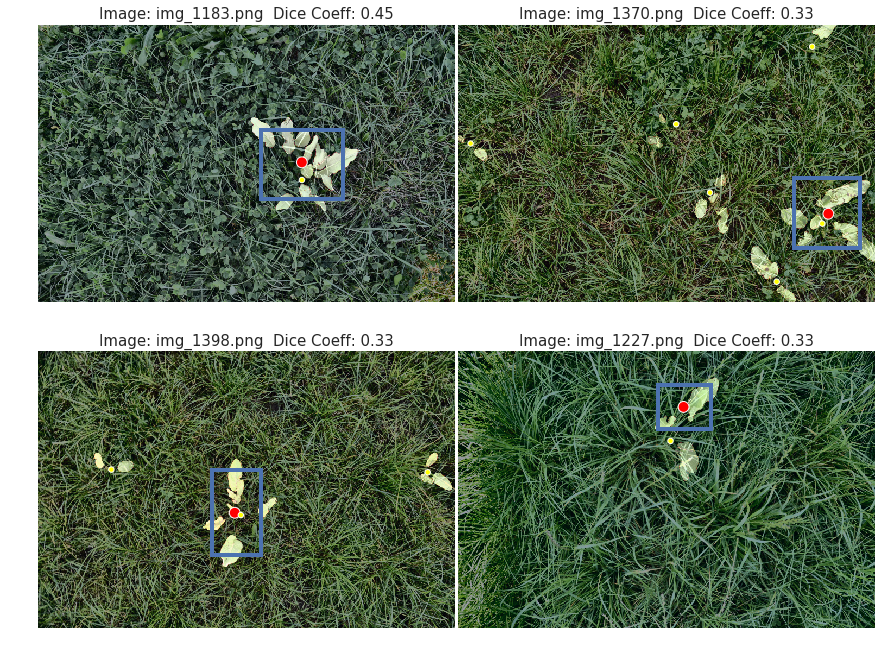

In [27]:
root_pred.show_matrix('random',mode="image_prediction_roots",rows=2)

### 3.7 Visualize Error Mask

In [44]:
ev_params = {'df':test_df,
             'input_shape':(512,768,3),
             'pred_layer' : 1,
             'model':model}
ev = Evaluate(**ev_params)

Aufsummiern aller falsch detektieren Masken (False Positive + False Negative):

In [48]:
def predict_all_error(df):
    error_sum = np.zeros(SHAPE)
    for i, row in df.iterrows():
        err = ev.get_full_error_mask(index=row['name'])
        error_sum += err
    return error_sum

In [49]:
summed_mask_error = predict_all_error(test_df)

Visualisierung aller überlagerten False Positiv + False Negativ Masken:

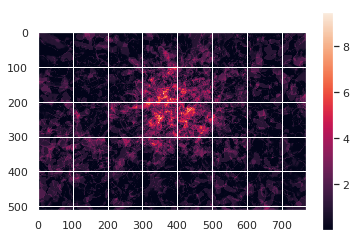

In [50]:
imshow(summed_mask_error)
plt.colorbar()

In [56]:
summed_mask_train = np.zeros((1024,1536))
for i,row in test_df.iterrows():
    summed_mask_train += rle_decode(row['mask_rle'],(1024,1536))
summed_mask_train = resize(summed_mask_train,(512,768))

Vergleich der summierten Trainingsmasken (Bild rechts) mit den summierten Falschen vorhersagen (Bild mitte). Das Bild rechts zeigt die subtraktion der normalisierten Trainingsmasken mit den normalisierten False Positiv + False Negativ:

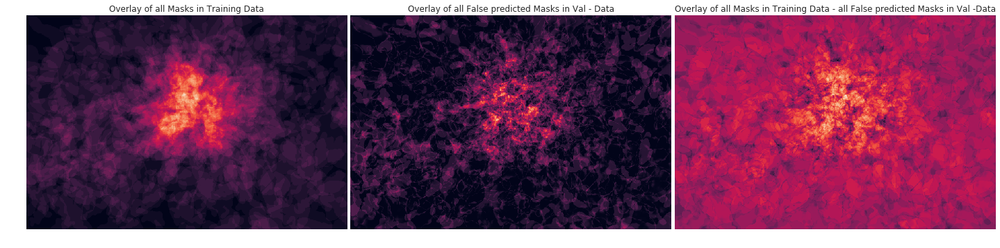

In [57]:
fig, axs = plt.subplots(ncols=3,nrows=1,figsize=(25,18))
axs[0].imshow(summed_mask_train)
axs[1].imshow(summed_mask_error)
#axs[1,0].imshow(summed_mask_train-summed_mask_error)
axs[2].imshow(summed_mask_train/summed_mask_train.max()-summed_mask_error/summed_mask_error.max())
axs[0].set_title('Overlay of all Masks in Training Data')
axs[0].axis('off')
axs[1].set_title('Overlay of all False predicted Masks in Val - Data')
axs[1].axis('off')
axs[2].set_title('Overlay of all Masks in Training Data - all False predicted Masks in Val -Data')
axs[2].axis('off')
plt.subplots_adjust(wspace=0.01, hspace=0)

Die meisten falsch vohergesagten Masken befinden sich zwar im Zentrum der Bilder (wie die meisten Masken in den Trainingsbildern), jedoch sind diese besser Verteilt als die Ground Truth Masken. (Die Farbskalierung der Bilder ist bei beiden gleich) 
Daraus schliesse ich, das sich die Anhäufung der GroundTruth- Masken in den Trainingsdaten im Zentrum, negativ auf die vorhersagen von Blacken im Randbereich asuwirkt. d.h. es werden im Randbereich der Bilder überdurchschnittlich viele Blacken falsch vorhergesagt.

<img src="../docs/notebook_images/False_negativ_positv.png">